# Peter Chika Ozo-ogueji
## CSC696_CV Homework-2


### Question 1: Color Space and Illumination


### Solution

Step 1:

Load the images
We will load two images, indoor.png and outdoor.png, which represent the same Rubik’s cube under different lighting conditions. These images will be read using OpenCV (cv2).


Step 2:

Extract and Plot R, G, B Channels Separately
Since OpenCV reads images in BGR format, we will convert them to RGB before splitting the channels.


Step 3:

Convert the Image to LAB Color Space
The conversion can be done using:
skimage.color.rgb2lab()
cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

Step 4:

Extract and Plot L, A, B Channels Separately
The L-channel (lightness) represents brightness.
The A-channel contains the green-red color axis.
The B-channel contains the blue-yellow color axis.

In [ ]:
from google.colab import files
uploaded = files.upload()  # This will open a file picker dialog


Saving indoor.png to indoor.png
Saving outdoor.png to outdoor.png


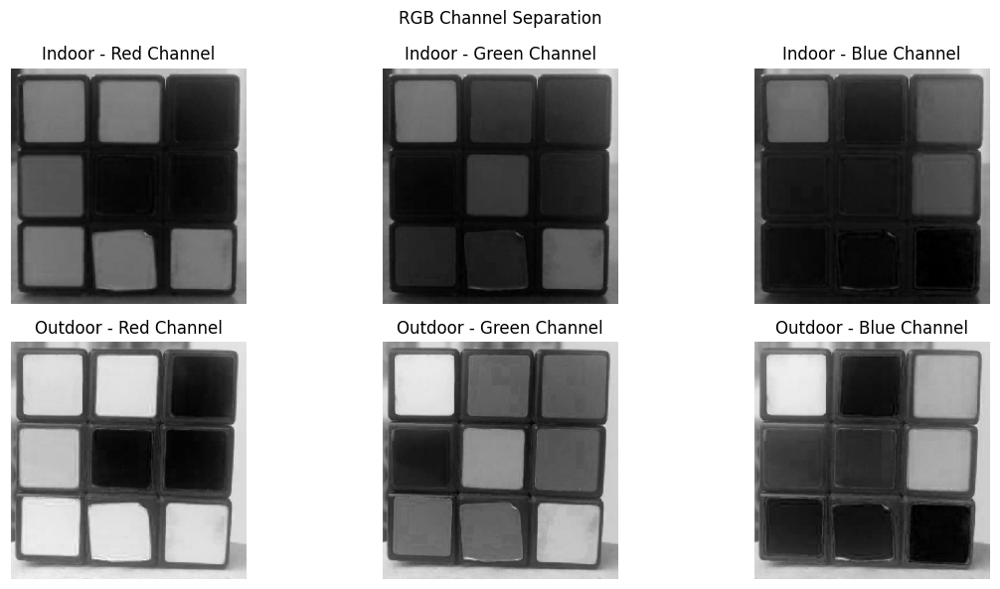

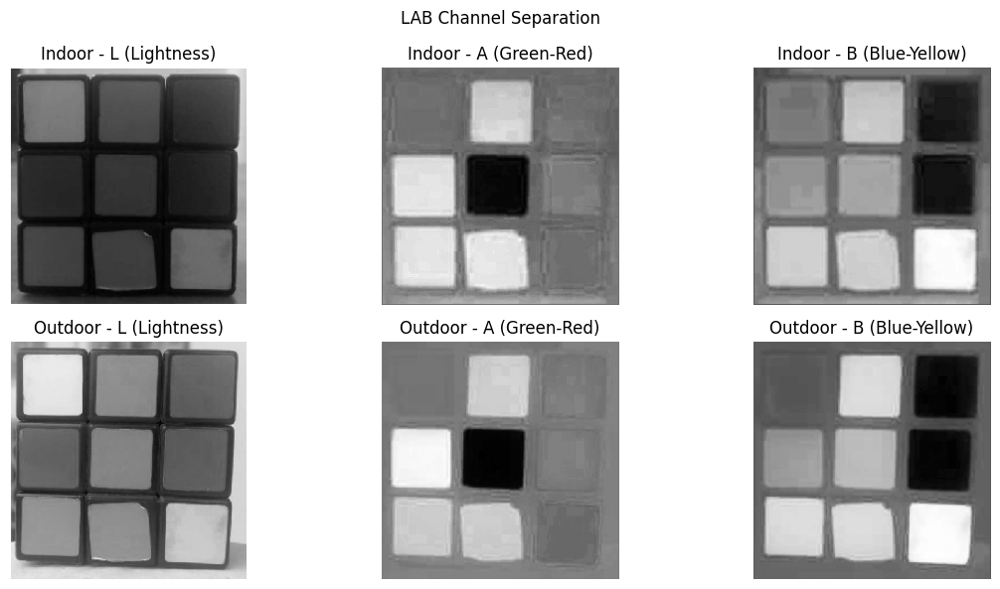

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to check if image is loaded properly
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Error: {image_path} could not be loaded. Check the file path.")
    return img

# Load images safely
try:
    indoor_img = load_image("indoor.png")
    outdoor_img = load_image("outdoor.png")

    # Convert BGR to RGB
    indoor_rgb = cv2.cvtColor(indoor_img, cv2.COLOR_BGR2RGB)
    outdoor_rgb = cv2.cvtColor(outdoor_img, cv2.COLOR_BGR2RGB)

    # Split RGB channels
    indoor_r, indoor_g, indoor_b = cv2.split(indoor_rgb)
    outdoor_r, outdoor_g, outdoor_b = cv2.split(outdoor_rgb)

    # Plot RGB channels separately without axis labels
    fig, axes = plt.subplots(2, 3, figsize=(12, 6))
    fig.suptitle("RGB Channel Separation")

    images = [(indoor_r, "Indoor - Red Channel"), (indoor_g, "Indoor - Green Channel"), (indoor_b, "Indoor - Blue Channel"),
              (outdoor_r, "Outdoor - Red Channel"), (outdoor_g, "Outdoor - Green Channel"), (outdoor_b, "Outdoor - Blue Channel")]

    for ax, (img, title) in zip(axes.flat, images):
        ax.imshow(img, cmap="gray")
        ax.set_title(title)
        ax.axis("off")  # Remove axis labels

    plt.tight_layout()
    plt.show()

    # Convert to LAB color space
    indoor_lab = cv2.cvtColor(indoor_img, cv2.COLOR_BGR2LAB)
    outdoor_lab = cv2.cvtColor(outdoor_img, cv2.COLOR_BGR2LAB)

    # Split L, A, B channels
    indoor_L, indoor_A, indoor_B = cv2.split(indoor_lab)
    outdoor_L, outdoor_A, outdoor_B = cv2.split(outdoor_lab)

    # Plot LAB channels without axis labels
    fig, axes = plt.subplots(2, 3, figsize=(12, 6))
    fig.suptitle("LAB Channel Separation")

    images = [(indoor_L, "Indoor - L (Lightness)"), (indoor_A, "Indoor - A (Green-Red)"), (indoor_B, "Indoor - B (Blue-Yellow)"),
              (outdoor_L, "Outdoor - L (Lightness)"), (outdoor_A, "Outdoor - A (Green-Red)"), (outdoor_B, "Outdoor - B (Blue-Yellow)")]

    for ax, (img, title) in zip(axes.flat, images):
        ax.imshow(img, cmap="gray")
        ax.set_title(title)
        ax.axis("off")  # Remove axis labels

    plt.tight_layout()
    plt.show()

except FileNotFoundError as e:
    print(e)


## Question 1b

### The LAB color space is superior for separating illuminance because it effectively isolates brightness variations while preserving color information.By examining the L (Lightness) channel, it becomes evident that this component captures differences in illumination between indoor and outdoor conditions without being influenced by hue. The A (Green-Red) and B (Blue-Yellow) channels remain relatively stable across different lighting conditions, indicating that they effectively maintain color information independently of illumination changes. In contrast, the RGB color space does not provide a clear separation between brightness and color. All three RGB channels (Red, Green, and Blue) exhibit noticeable differences between indoor and outdoor lighting, making it challenging to differentiate illumination effects from actual color variations. The strong correlation of RGB channels with lighting changes contrasts with LAB’s orthogonal design, where illumination effects are primarily contained in the L channel. This makes LAB a more effective choice for applications requiring consistent color representation across varying lighting conditions.

In [ ]:
from google.colab import files
uploaded = files.upload()  # This will open a file picker dialog


Saving img1.jpg to img1.jpg
Saving img2.jpg to img2.jpg


## Question 1c

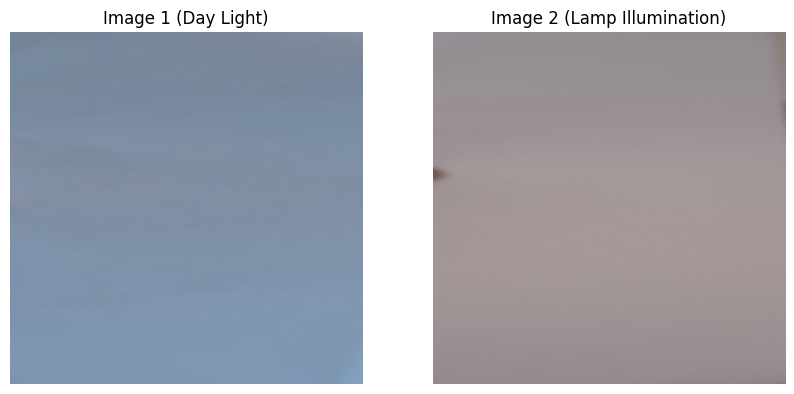

In [ ]:
from google.colab import files
# Load images
img1 = cv2.imread('img1.jpg')
img2 = cv2.imread('img2.jpg')

# Resize to 256x256
img1_resized = cv2.resize(img1, (256, 256))
img2_resized = cv2.resize(img2, (256, 256))

# Save resized images
cv2.imwrite('im1.jpg', img1_resized)
cv2.imwrite('im2.jpg', img2_resized)

# Write info.txt with coordinates and lighting conditions
with open('info.txt', 'w') as f:
   f.write("100,100,100,100\n")  # Example coordinates for 32x32 patch
   f.write("window daylight, warm desk lamp illumination\n")

# Display images to verify
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(cv2.cvtColor(img1_resized, cv2.COLOR_BGR2RGB))
plt.title('Image 1 (Day Light)')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB))
plt.title('Image 2 (Lamp Illumination)')
plt.axis('off')
plt.show()

In [ ]:
# folder of Prokudin-Gorskii’s black-and-white (grayscale) image composites (prokudin-gorskii/ in the assignment zip).

from google.colab import files
uploaded = files.upload()  # This will open a file picker dialog

Saving 00125v.jpg to 00125v.jpg
Saving 00149v.jpg to 00149v.jpg
Saving 00153v.jpg to 00153v.jpg
Saving 00351v.jpg to 00351v.jpg
Saving 00398v.jpg to 00398v.jpg
Saving 01112v.jpg to 01112v.jpg


## Question 1b:

To correct the image with the colored light source and achieve white balancing using histogram manipulation, we can apply Histogram Equalization and Gray World Assumption. Below is the implementation in Python using OpenCV:


Approach: Histogram Manipulation for White Balancing
Convert the image to the LAB color space, which separates luminance (L) from color information (A, B).
Perform histogram equalization on the L-channel to normalize the brightness.
Merge the corrected L-channel back with the A and B channels.
Convert the image back to the RGB color space for display.

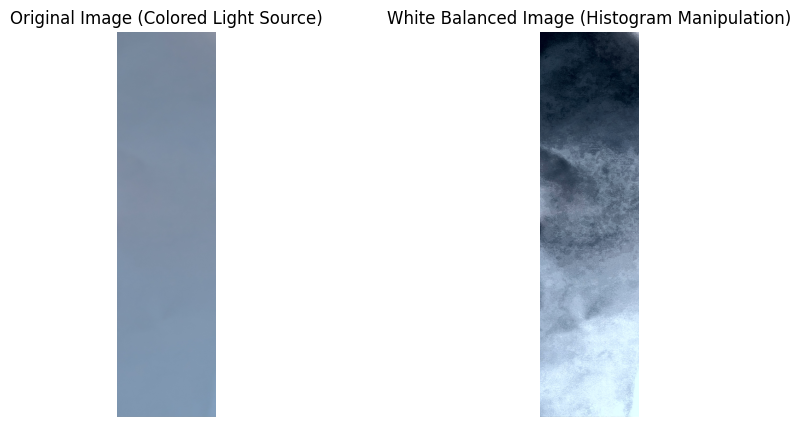

In [ ]:
# Load the image
image = cv2.imread("img1.jpg")  # Change filename as needed
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for proper visualization

# Convert image to LAB color space
lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)

# Split LAB channels
l_channel, a_channel, b_channel = cv2.split(lab)

# Apply histogram equalization on L-channel
l_equalized = cv2.equalizeHist(l_channel)

# Merge equalized L-channel back with A and B channels
lab_corrected = cv2.merge((l_equalized, a_channel, b_channel))

# Convert back to RGB color space
corrected_image = cv2.cvtColor(lab_corrected, cv2.COLOR_LAB2RGB)

# Display original and corrected images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(image)
axes[0].set_title("Original Image (Colored Light Source)")
axes[0].axis("off")

axes[1].imshow(corrected_image)
axes[1].set_title("White Balanced Image (Histogram Manipulation)")
axes[1].axis("off")

plt.show()


## Question 2: Prokudin-Gorskii: Color from grayscale photographs
### Task1

## Question 2
## Task 1:

In [ ]:
# tableau/efros tableau.jpg
from google.colab import files
uploaded = files.upload()  # This will open a file picker dialog

Saving efros_tableau.jpg to efros_tableau.jpg
Saving seoul_tableau.jpg to seoul_tableau.jpg
Saving vancouver_tableau.jpg to vancouver_tableau.jpg


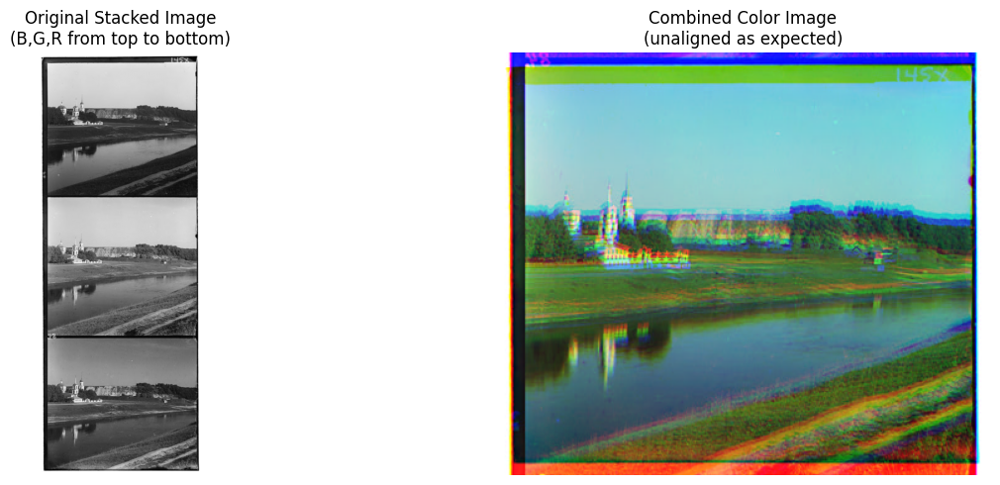

Combined image saved to combined_rgb_image.jpg
Note: Image is intentionally unaligned as per Task 1 requirements.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def combine_channels(image_path, output_path):
    """
    Takes a vertically stacked BGR image and combines into a color image in RGB order.
    Note: The result will be unaligned as per Task 1 requirements.

    Args:
        image_path: Path to input image (B,G,R stacked vertically)
        output_path: Path to save the combined color image in RGB order
    """
    # Read the image in grayscale
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not read image: {image_path}")

    # Get image dimensions
    height = img.shape[0]
    third = height // 3

    # Split into three channels (input is B,G,R from top to bottom)
    blue = img[0:third, :]
    green = img[third:2*third, :]
    red = img[2*third:3*third, :]

    # Create color image in RGB order as specified in the task
    color_img = np.zeros((third, img.shape[1], 3), dtype=np.uint8)
    color_img[:,:,0] = red     # R channel
    color_img[:,:,1] = green   # G channel
    color_img[:,:,2] = blue    # B channel

    # Convert to BGR for cv2.imwrite
    color_img_bgr = cv2.cvtColor(color_img, cv2.COLOR_RGB2BGR)

    # Save the result
    cv2.imwrite(output_path, color_img_bgr)

    return color_img  # Return in RGB order for display

def display_results(original_img, combined_img):
    """
    Display original and combined images side by side
    """
    plt.figure(figsize=(15, 5))

    # Display original image
    plt.subplot(121)
    plt.imshow(original_img, cmap='gray')
    plt.title('Original Stacked Image\n(B,G,R from top to bottom)')
    plt.axis('off')

    # Display combined image (already in RGB order)
    plt.subplot(122)
    plt.imshow(combined_img)
    plt.title('Combined Color Image\n(unaligned as expected)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    # Process a single image from prokudin-gorskii folder
    input_path = '00125v.jpg'
    output_path = 'combined_rgb_image.jpg'

    try:
        # Read original image for display
        original_img = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)

        # Combine channels and save result
        combined_img = combine_channels(input_path, output_path)

        # Display results
        display_results(original_img, combined_img)

        print(f"Combined image saved to {output_path}")
        print("Note: Image is intentionally unaligned as per Task 1 requirements.")
    except Exception as e:
        print(f"Error: {str(e)}")

## Question 2
## Task 2: Alignment :


Processing Prokudin-Gorskii image: 00125v.jpg


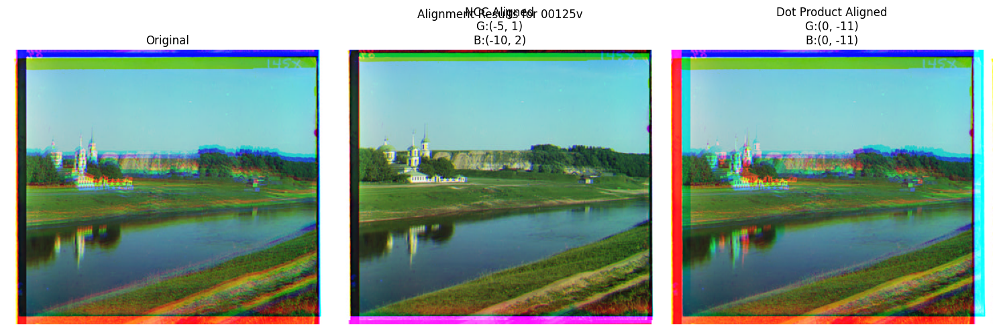

Results for 00125v.jpg:
NCC offsets: Green=(-5, 1), Blue=(-10, 2)
Dot offsets: Green=(0, -11), Blue=(0, -11)

Processing Prokudin-Gorskii image: 00149v.jpg


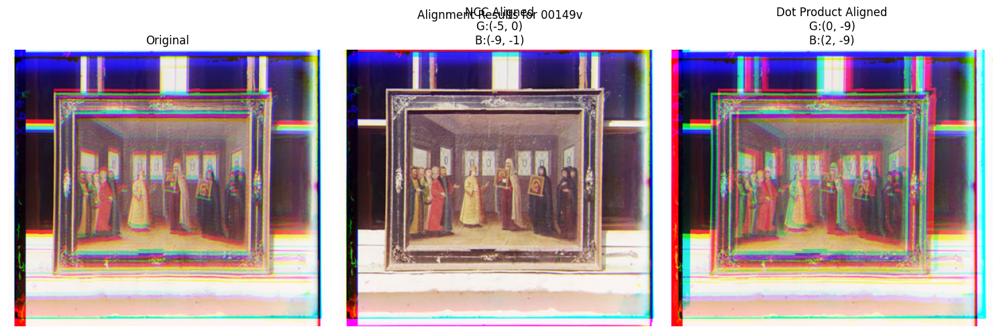

Results for 00149v.jpg:
NCC offsets: Green=(-5, 0), Blue=(-9, -1)
Dot offsets: Green=(0, -9), Blue=(2, -9)

Processing Prokudin-Gorskii image: 00153v.jpg


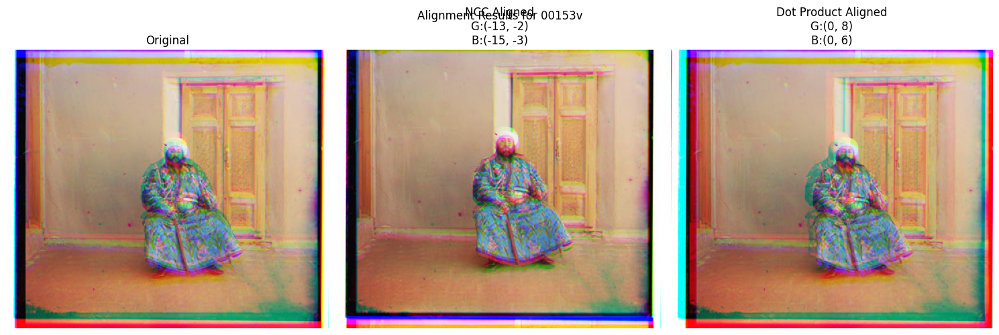

Results for 00153v.jpg:
NCC offsets: Green=(-13, -2), Blue=(-15, -3)
Dot offsets: Green=(0, 8), Blue=(0, 6)

Processing Prokudin-Gorskii image: 00351v.jpg


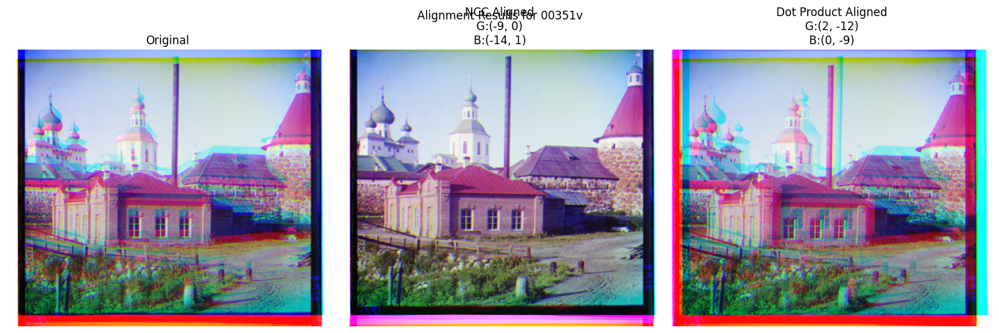

Results for 00351v.jpg:
NCC offsets: Green=(-9, 0), Blue=(-14, 1)
Dot offsets: Green=(2, -12), Blue=(0, -9)

Processing Prokudin-Gorskii image: 00398v.jpg


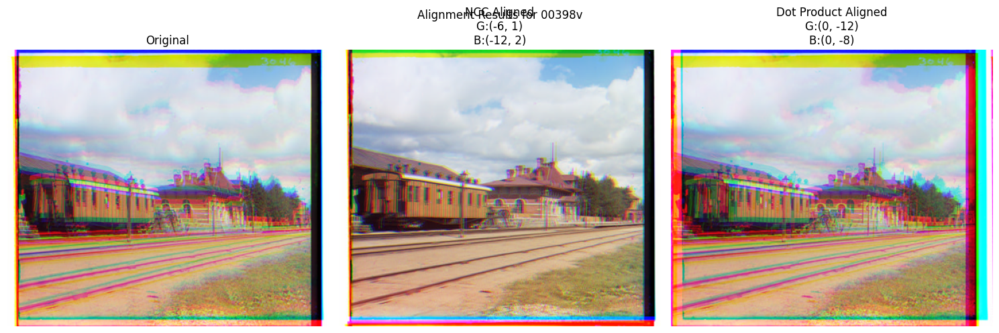

Results for 00398v.jpg:
NCC offsets: Green=(-6, 1), Blue=(-12, 2)
Dot offsets: Green=(0, -12), Blue=(0, -8)

Processing Prokudin-Gorskii image: 01112v.jpg


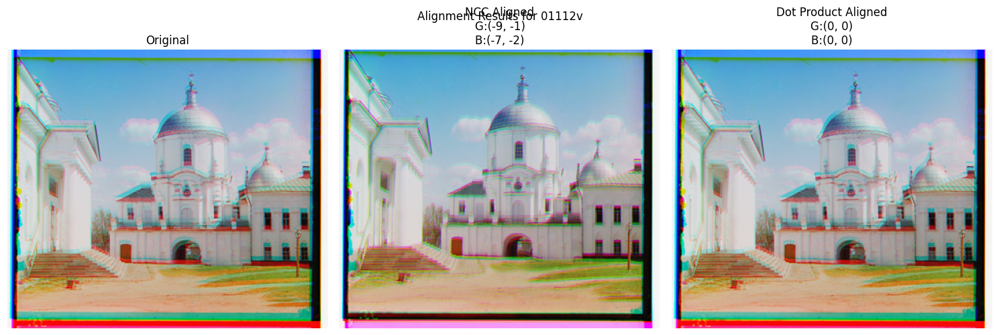

Results for 01112v.jpg:
NCC offsets: Green=(-9, -1), Blue=(-7, -2)
Dot offsets: Green=(0, 0), Blue=(0, 0)

Processing Efros tableau...


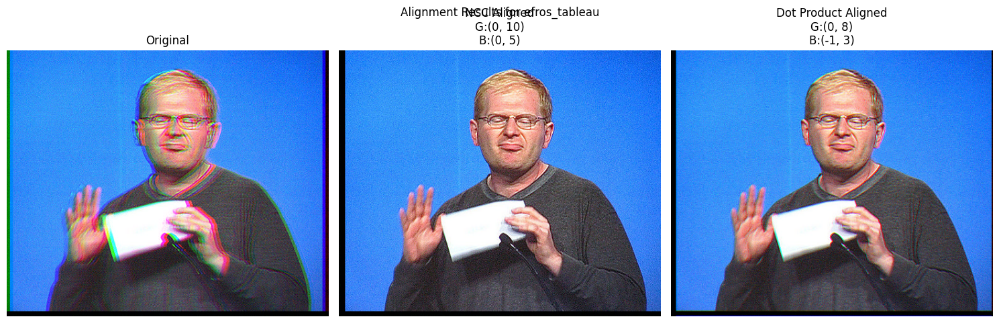

Results for Efros tableau:
NCC offsets: Green=(0, 10), Blue=(0, 5)
Dot offsets: Green=(0, 8), Blue=(-1, 3)

Processing complete! Results saved in 'results' directory


In [ ]:
import cv2
import numpy as np
from numpy.linalg import norm
import matplotlib.pyplot as plt
import os

def compute_similarity(fixed_channel, moving_channel, metric='ncc'):
    """
    Compute similarity between channels using either normalized cross-correlation or dot product
    """
    if metric == 'ncc':
        # Normalize vectors using L2-norm and compute dot product
        fixed_norm = fixed_channel / norm(fixed_channel.flatten())
        moving_norm = moving_channel / norm(moving_channel.flatten())
        return np.sum(fixed_norm * moving_norm)
    else:
        # Simple dot product without normalization
        return np.sum(fixed_channel * moving_channel)

def align_channels(fixed_channel, moving_channel, search_range=15, metric='ncc'):
    """
    Find optimal offset to align moving channel to fixed channel
    """
    best_offset = (0, 0)
    best_similarity = float('-inf')
    height, width = fixed_channel.shape

    for dy in range(-search_range, search_range + 1):
        for dx in range(-search_range, search_range + 1):
            # Roll the channel
            shifted = np.roll(np.roll(moving_channel, dy, axis=0), dx, axis=1)

            # Calculate valid region unaffected by rolling
            valid_y_start = max(0, dy)
            valid_y_end = min(height, height + dy)
            valid_x_start = max(0, dx)
            valid_x_end = min(width, width + dx)
            valid_region = np.s_[valid_y_start:valid_y_end, valid_x_start:valid_x_end]

            # Compute similarity on valid region
            similarity = compute_similarity(
                fixed_channel[valid_region],
                shifted[valid_region],
                metric
            )

            if similarity > best_similarity:
                best_similarity = similarity
                best_offset = (dy, dx)

    return best_offset

def align_image(img_path, metric='ncc'):
    """
    Align and combine channels of a three-channel image
    """
    # Read image
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not read {img_path}")

    # Split into three equal parts
    height = img.shape[0]
    third = height // 3

    # Extract channels
    blue = img[0:third, :]
    green = img[third:2*third, :]
    red = img[2*third:3*third, :]

    # Align channels to red
    green_offset = align_channels(red, green, metric=metric)
    blue_offset = align_channels(red, blue, metric=metric)

    # Apply found offsets
    aligned_green = np.roll(np.roll(green, green_offset[0], axis=0), green_offset[1], axis=1)
    aligned_blue = np.roll(np.roll(blue, blue_offset[0], axis=0), blue_offset[1], axis=1)

    # Combine into color image
    aligned_img = cv2.merge([aligned_blue, aligned_green, red])

    return aligned_img, green_offset, blue_offset

def process_and_visualize(img_path, output_dir='results'):
    """
    Process image using both metrics and visualize results
    """
    os.makedirs(output_dir, exist_ok=True)

    # Process with both metrics
    aligned_ncc, green_off_ncc, blue_off_ncc = align_image(img_path, metric='ncc')
    aligned_dot, green_off_dot, blue_off_dot = align_image(img_path, metric='dot')

    # Save aligned images
    base_name = os.path.splitext(os.path.basename(img_path))[0]
    cv2.imwrite(os.path.join(output_dir, f'aligned_ncc_{base_name}.jpg'), aligned_ncc)
    cv2.imwrite(os.path.join(output_dir, f'aligned_dot_{base_name}.jpg'), aligned_dot)

    # Create visualization
    fig = plt.figure(figsize=(15, 5))

    # Original image
    img = cv2.imread(img_path)
    height = img.shape[0] // 3
    original = cv2.merge([
        img[0:height, :, 0],
        img[height:2*height, :, 0],
        img[2*height:3*height, :, 0]
    ])

    plt.subplot(131)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')

    # NCC result
    plt.subplot(132)
    plt.imshow(cv2.cvtColor(aligned_ncc, cv2.COLOR_BGR2RGB))
    plt.title(f'NCC Aligned\nG:{green_off_ncc}\nB:{blue_off_ncc}')
    plt.axis('off')

    # Dot product result
    plt.subplot(133)
    plt.imshow(cv2.cvtColor(aligned_dot, cv2.COLOR_BGR2RGB))
    plt.title(f'Dot Product Aligned\nG:{green_off_dot}\nB:{blue_off_dot}')
    plt.axis('off')

    plt.suptitle(f'Alignment Results for {base_name}')
    plt.tight_layout()

    # Save visualization
    plt.savefig(os.path.join(output_dir, f'comparison_{base_name}.png'))
    plt.show()
    plt.close()

    return {
        'ncc': {'green_offset': green_off_ncc, 'blue_offset': blue_off_ncc},
        'dot': {'green_offset': green_off_dot, 'blue_offset': blue_off_dot}
    }

def process_all_images():
    """
    Process all Prokudin-Gorskii images and Efros tableau
    """
    # Create output directory
    output_dir = 'results'
    os.makedirs(output_dir, exist_ok=True)

    # Process Prokudin-Gorskii images
    prokudin_files = [
        '00125v.jpg',
        '00149v.jpg',
        '00153v.jpg',
        '00351v.jpg',
        '00398v.jpg',
        '01112v.jpg'
    ]

    results = {}

    # Process Prokudin-Gorskii images
    for img_file in prokudin_files:
        print(f"\nProcessing Prokudin-Gorskii image: {img_file}")
        try:
            results[img_file] = process_and_visualize(img_file, output_dir)
            print(f"Results for {img_file}:")
            print(f"NCC offsets: Green={results[img_file]['ncc']['green_offset']}, "
                  f"Blue={results[img_file]['ncc']['blue_offset']}")
            print(f"Dot offsets: Green={results[img_file]['dot']['green_offset']}, "
                  f"Blue={results[img_file]['dot']['blue_offset']}")
        except Exception as e:
            print(f"Error processing {img_file}: {str(e)}")

    # Process Efros tableau
    efros_path = 'efros_tableau.jpg'
    print("\nProcessing Efros tableau...")
    try:
        results['efros_tableau'] = process_and_visualize(efros_path, output_dir)
        print("Results for Efros tableau:")
        print(f"NCC offsets: Green={results['efros_tableau']['ncc']['green_offset']}, "
              f"Blue={results['efros_tableau']['ncc']['blue_offset']}")
        print(f"Dot offsets: Green={results['efros_tableau']['dot']['green_offset']}, "
              f"Blue={results['efros_tableau']['dot']['blue_offset']}")
    except Exception as e:
        print(f"Error processing Efros tableau: {str(e)}")

    return results

if __name__ == "__main__":
    results = process_all_images()
    print("\nProcessing complete! Results saved in 'results' directory")

## Question-2
## Task 3: Pyramid

In [ ]:
# tableau/efros tableau.jpg
from google.colab import files
uploaded = files.upload()  # This will open a file picker dialog

Saving efros_tableau.jpg to efros_tableau.jpg
Saving seoul_tableau.jpg to seoul_tableau.jpg
Saving vancouver_tableau.jpg to vancouver_tableau.jpg



Processing seoul_tableau.jpg
Initial dimensions - Blue: (1088, 1636), Green: (1088, 1636), Red: (1088, 1636)
Final dimensions - Blue: (1088, 1636), Green: (1088, 1636), Red: (1088, 1636)


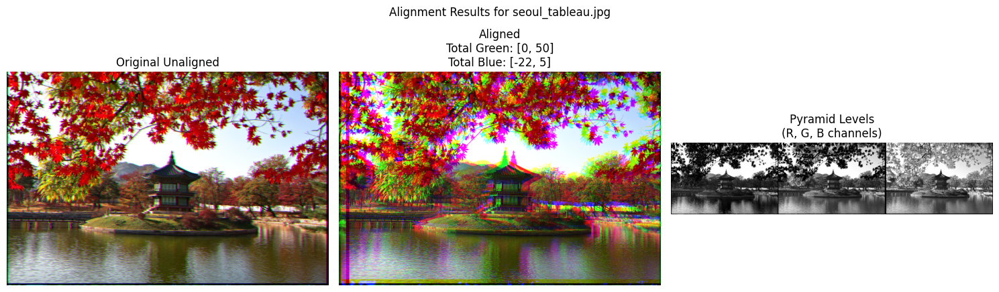

Results for seoul_tableau:
Level 0:
  Green offset: (0, 2)
  Blue offset: (-1, 0)
Level 1:
  Green offset: (0, 3)
  Blue offset: (-1, 1)
Level 2:
  Green offset: (0, 6)
  Blue offset: (-2, 1)
Total offsets:
  Green: [0, 50]
  Blue: [-22, 5]

Processing vancouver_tableau.jpg
Initial dimensions - Blue: (1091, 1650), Green: (1091, 1650), Red: (1091, 1650)
Final dimensions - Blue: (1091, 1650), Green: (1091, 1650), Red: (1091, 1650)


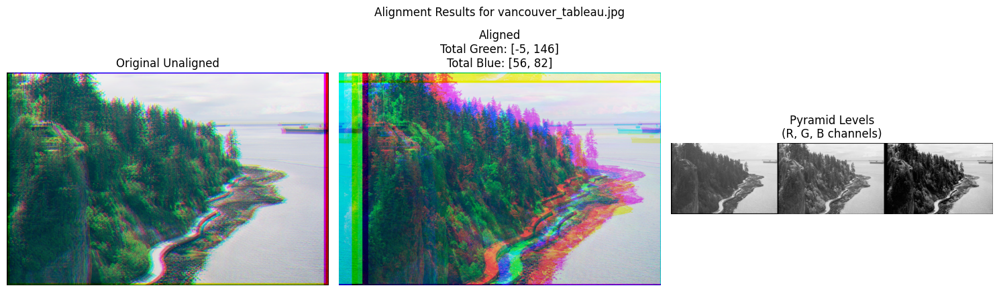

Results for vancouver_tableau:
Level 0:
  Green offset: (0, 6)
  Blue offset: (2, 3)
Level 1:
  Green offset: (-1, 10)
  Blue offset: (4, 6)
Level 2:
  Green offset: (-1, 10)
  Blue offset: (8, 10)
Total offsets:
  Green: [-5, 146]
  Blue: [56, 82]

Processing complete! Results saved as aligned_*.jpg


In [ ]:
import cv2
import numpy as np
from numpy.linalg import norm
import matplotlib.pyplot as plt

def compute_similarity(fixed_channel, moving_channel, metric='ncc'):
    """Compute similarity between channels using NCC or dot product."""
    if metric == 'ncc':
        fixed_norm = fixed_channel / norm(fixed_channel.flatten())
        moving_norm = moving_channel / norm(moving_channel.flatten())
        return np.sum(fixed_norm * moving_norm)
    else:
        return np.sum(fixed_channel * moving_channel)

def align_channels(fixed_channel, moving_channel, search_range=10, metric='ncc'):
    """Find the optimal shift to align channels."""
    best_offset = (0, 0)
    best_similarity = float('-inf')
    height, width = fixed_channel.shape

    for dy in range(-search_range, search_range + 1):
        for dx in range(-search_range, search_range + 1):
            shifted = np.roll(np.roll(moving_channel, dy, axis=0), dx, axis=1)
            similarity = compute_similarity(fixed_channel, shifted, metric)

            if similarity > best_similarity:
                best_similarity = similarity
                best_offset = (dy, dx)

    return best_offset

def ensure_same_size(channels):
    """Ensure all channels have the same size by cropping to smallest dimensions."""
    min_height = min(channel.shape[0] for channel in channels)
    min_width = min(channel.shape[1] for channel in channels)
    return [channel[:min_height, :min_width].copy() for channel in channels]

def create_pyramid(img, levels=3):
    """Create an image pyramid with specified number of levels."""
    pyramid = [img.copy()]
    for _ in range(levels - 1):
        pyramid.append(cv2.pyrDown(pyramid[-1]))
    return pyramid[::-1]  # Return pyramid from lowest to highest resolution

def visualize_alignment(original_img, aligned_img, pyramid_levels, total_offsets, title=''):
    """Visualize the alignment results and pyramid levels."""
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(131)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title('Original Unaligned')
    plt.axis('off')

    # Aligned image
    plt.subplot(132)
    plt.imshow(cv2.cvtColor(aligned_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Aligned\nTotal Green: {total_offsets[0]}\nTotal Blue: {total_offsets[1]}')
    plt.axis('off')

    # Pyramid levels
    plt.subplot(133)
    pyramid_viz = np.vstack([
        np.hstack([
            level[:level.shape[0]//3, :],
            level[level.shape[0]//3:2*level.shape[0]//3, :],
            level[2*level.shape[0]//3:, :]
        ])
        for level in pyramid_levels
    ])
    plt.imshow(pyramid_viz, cmap='gray')
    plt.title('Pyramid Levels\n(R, G, B channels)')
    plt.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def pyramid_align_image(img_path, metric='ncc'):
    """Align image using three-level pyramid approach."""
    # Read image
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not read {img_path}")

    # Split into three channels
    height = img.shape[0]
    third = height // 3
    blue = img[:third, :].copy()
    green = img[third:2*third, :].copy()
    red = img[2*third:, :].copy()

    # Ensure initial channels are the same size
    blue, green, red = ensure_same_size([blue, green, red])
    print(f"Initial dimensions - Blue: {blue.shape}, Green: {green.shape}, Red: {red.shape}")

    # Create pyramids
    red_pyramid = create_pyramid(red)
    green_pyramid = create_pyramid(green)
    blue_pyramid = create_pyramid(blue)

    # Initialize offsets
    total_green_offset = [0, 0]
    total_blue_offset = [0, 0]
    level_offsets = []

    # Store original image for visualization
    original_img = cv2.merge([blue, green, red])

    # Process each level from lowest to highest resolution
    for level in range(3):
        # Get current pyramid level
        red_level = red_pyramid[level]
        green_level = green_pyramid[level]
        blue_level = blue_pyramid[level]

        # Ensure same size at current level
        red_level, green_level, blue_level = ensure_same_size([red_level, green_level, blue_level])

        # Compute offsets at current level
        green_offset = align_channels(red_level, green_level, search_range=10, metric=metric)
        blue_offset = align_channels(red_level, blue_level, search_range=10, metric=metric)

        # Store level offsets
        level_offsets.append({
            'level': level,
            'green_offset': green_offset,
            'blue_offset': blue_offset
        })

        # Scale and accumulate offsets
        scale = 4 ** (2 - level)  # 16 for level 0, 4 for level 1, 1 for level 2
        total_green_offset[0] += green_offset[0] * scale
        total_green_offset[1] += green_offset[1] * scale
        total_blue_offset[0] += blue_offset[0] * scale
        total_blue_offset[1] += blue_offset[1] * scale

    # Apply final offsets
    aligned_green = np.roll(np.roll(green, total_green_offset[0], axis=0),
                          total_green_offset[1], axis=1)
    aligned_blue = np.roll(np.roll(blue, total_blue_offset[0], axis=0),
                         total_blue_offset[1], axis=1)

    # Final size adjustment
    aligned_blue, aligned_green, red = ensure_same_size([aligned_blue, aligned_green, red])
    print(f"Final dimensions - Blue: {aligned_blue.shape}, Green: {aligned_green.shape}, Red: {red.shape}")

    # Merge channels
    aligned_img = cv2.merge([aligned_blue, aligned_green, red])

    # Visualize results
    visualize_alignment(original_img, aligned_img, [img], (total_green_offset, total_blue_offset),
                       title=f'Alignment Results for {img_path}')

    return aligned_img, level_offsets, (total_green_offset, total_blue_offset)

def process_tableau_images():
    """Process Seoul and Vancouver tableau images."""
    images = ['seoul_tableau.jpg', 'vancouver_tableau.jpg']
    results = {}

    for img_path in images:
        print(f"\nProcessing {img_path}")
        try:
            aligned_img, level_offsets, total_offsets = pyramid_align_image(img_path)

            # Save results
            base_name = img_path.split('.')[0]
            cv2.imwrite(f'aligned_{base_name}.jpg', aligned_img)

            results[base_name] = {
                'level_offsets': level_offsets,
                'total_offsets': total_offsets
            }

            # Print results
            print(f"Results for {base_name}:")
            for level in level_offsets:
                print(f"Level {level['level']}:")
                print(f"  Green offset: {level['green_offset']}")
                print(f"  Blue offset: {level['blue_offset']}")
            print(f"Total offsets:")
            print(f"  Green: {total_offsets[0]}")
            print(f"  Blue: {total_offsets[1]}")

        except Exception as e:
            print(f"Error processing {img_path}: {str(e)}")

    return results

if __name__ == "__main__":
    results = process_tableau_images()
    print("\nProcessing complete! Results saved as aligned_*.jpg")


Processing seoul_tableau.jpg
Initial dimensions - Blue: (1088, 1636), Green: (1088, 1636), Red: (1088, 1636)
Final dimensions - Blue: (1088, 1636), Green: (1088, 1636), Red: (1088, 1636)


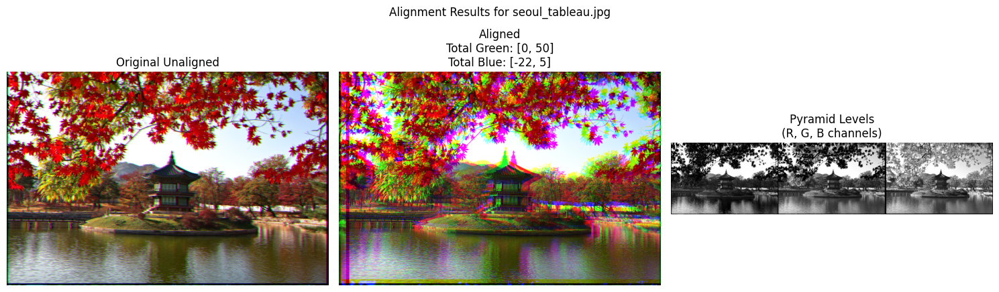

Results for seoul_tableau:
Level 0:
  Green offset: (0, 2)
  Blue offset: (-1, 0)
Level 1:
  Green offset: (0, 3)
  Blue offset: (-1, 1)
Level 2:
  Green offset: (0, 6)
  Blue offset: (-2, 1)
Total offsets:
  Green: [0, 50]
  Blue: [-22, 5]

Processing vancouver_tableau.jpg
Initial dimensions - Blue: (1091, 1650), Green: (1091, 1650), Red: (1091, 1650)
Final dimensions - Blue: (1091, 1650), Green: (1091, 1650), Red: (1091, 1650)


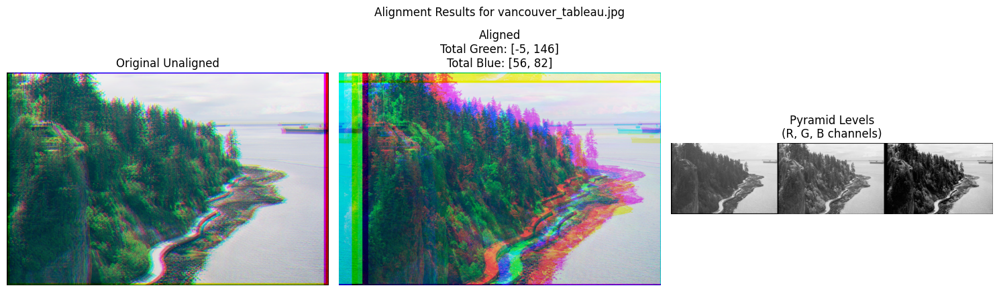

Results for vancouver_tableau:
Level 0:
  Green offset: (0, 6)
  Blue offset: (2, 3)
Level 1:
  Green offset: (-1, 10)
  Blue offset: (4, 6)
Level 2:
  Green offset: (-1, 10)
  Blue offset: (8, 10)
Total offsets:
  Green: [-5, 146]
  Blue: [56, 82]

Processing complete! Results saved as aligned_*.jpg


In [ ]:
import cv2
import numpy as np
from numpy.linalg import norm
import matplotlib.pyplot as plt

def compute_similarity(fixed_channel, moving_channel, metric='ncc'):
    """Compute similarity between channels using NCC or dot product."""
    if metric == 'ncc':
        fixed_norm = fixed_channel / norm(fixed_channel.flatten())
        moving_norm = moving_channel / norm(moving_channel.flatten())
        return np.sum(fixed_norm * moving_norm)
    else:
        return np.sum(fixed_channel * moving_channel)

def align_channels(fixed_channel, moving_channel, search_range=10, metric='ncc'):
    """Find the optimal shift to align channels."""
    best_offset = (0, 0)
    best_similarity = float('-inf')
    height, width = fixed_channel.shape

    for dy in range(-search_range, search_range + 1):
        for dx in range(-search_range, search_range + 1):
            shifted = np.roll(np.roll(moving_channel, dy, axis=0), dx, axis=1)
            similarity = compute_similarity(fixed_channel, shifted, metric)

            if similarity > best_similarity:
                best_similarity = similarity
                best_offset = (dy, dx)

    return best_offset

def ensure_same_size(channels):
    """Ensure all channels have the same size by cropping to smallest dimensions."""
    min_height = min(channel.shape[0] for channel in channels)
    min_width = min(channel.shape[1] for channel in channels)
    return [channel[:min_height, :min_width].copy() for channel in channels]

def create_pyramid(img, levels=3):
    """Create an image pyramid with specified number of levels."""
    pyramid = [img.copy()]
    for _ in range(levels - 1):
        pyramid.append(cv2.pyrDown(pyramid[-1]))
    return pyramid[::-1]  # Return pyramid from lowest to highest resolution

def visualize_alignment(original_img, aligned_img, pyramid_levels, total_offsets, title=''):
    """Visualize the alignment results and pyramid levels."""
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(131)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title('Original Unaligned')
    plt.axis('off')

    # Aligned image
    plt.subplot(132)
    plt.imshow(cv2.cvtColor(aligned_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Aligned\nTotal Green: {total_offsets[0]}\nTotal Blue: {total_offsets[1]}')
    plt.axis('off')

    # Pyramid levels
    plt.subplot(133)
    pyramid_viz = np.vstack([
        np.hstack([
            level[:level.shape[0]//3, :],
            level[level.shape[0]//3:2*level.shape[0]//3, :],
            level[2*level.shape[0]//3:, :]
        ])
        for level in pyramid_levels
    ])
    plt.imshow(pyramid_viz, cmap='gray')
    plt.title('Pyramid Levels\n(R, G, B channels)')
    plt.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def pyramid_align_image(img_path, metric='ncc'):
    """Align image using three-level pyramid approach."""
    # Read image
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Could not read {img_path}")

    # Split into three channels
    height = img.shape[0]
    third = height // 3
    blue = img[:third, :].copy()
    green = img[third:2*third, :].copy()
    red = img[2*third:, :].copy()

    # Ensure initial channels are the same size
    blue, green, red = ensure_same_size([blue, green, red])
    print(f"Initial dimensions - Blue: {blue.shape}, Green: {green.shape}, Red: {red.shape}")

    # Create pyramids
    red_pyramid = create_pyramid(red)
    green_pyramid = create_pyramid(green)
    blue_pyramid = create_pyramid(blue)

    # Initialize offsets
    total_green_offset = [0, 0]
    total_blue_offset = [0, 0]
    level_offsets = []

    # Store original image for visualization
    original_img = cv2.merge([blue, green, red])

    # Process each level from lowest to highest resolution
    for level in range(3):
        # Get current pyramid level
        red_level = red_pyramid[level]
        green_level = green_pyramid[level]
        blue_level = blue_pyramid[level]

        # Ensure same size at current level
        red_level, green_level, blue_level = ensure_same_size([red_level, green_level, blue_level])

        # Compute offsets at current level
        green_offset = align_channels(red_level, green_level, search_range=10, metric=metric)
        blue_offset = align_channels(red_level, blue_level, search_range=10, metric=metric)

        # Store level offsets
        level_offsets.append({
            'level': level,
            'green_offset': green_offset,
            'blue_offset': blue_offset
        })

        # Scale and accumulate offsets
        scale = 4 ** (2 - level)  # 16 for level 0, 4 for level 1, 1 for level 2
        total_green_offset[0] += green_offset[0] * scale
        total_green_offset[1] += green_offset[1] * scale
        total_blue_offset[0] += blue_offset[0] * scale
        total_blue_offset[1] += blue_offset[1] * scale

    # Apply final offsets
    aligned_green = np.roll(np.roll(green, total_green_offset[0], axis=0),
                          total_green_offset[1], axis=1)
    aligned_blue = np.roll(np.roll(blue, total_blue_offset[0], axis=0),
                         total_blue_offset[1], axis=1)

    # Final size adjustment
    aligned_blue, aligned_green, red = ensure_same_size([aligned_blue, aligned_green, red])
    print(f"Final dimensions - Blue: {aligned_blue.shape}, Green: {aligned_green.shape}, Red: {red.shape}")

    # Merge channels
    aligned_img = cv2.merge([aligned_blue, aligned_green, red])

    # Visualize results
    visualize_alignment(original_img, aligned_img, [img], (total_green_offset, total_blue_offset),
                       title=f'Alignment Results for {img_path}')

    return aligned_img, level_offsets, (total_green_offset, total_blue_offset)

def process_tableau_images():
    """Process Seoul and Vancouver tableau images."""
    images = ['seoul_tableau.jpg', 'vancouver_tableau.jpg']
    results = {}

    for img_path in images:
        print(f"\nProcessing {img_path}")
        try:
            aligned_img, level_offsets, total_offsets = pyramid_align_image(img_path)

            # Save results
            base_name = img_path.split('.')[0]
            cv2.imwrite(f'aligned_{base_name}.jpg', aligned_img)

            results[base_name] = {
                'level_offsets': level_offsets,
                'total_offsets': total_offsets
            }

            # Print results
            print(f"Results for {base_name}:")
            for level in level_offsets:
                print(f"Level {level['level']}:")
                print(f"  Green offset: {level['green_offset']}")
                print(f"  Blue offset: {level['blue_offset']}")
            print(f"Total offsets:")
            print(f"  Green: {total_offsets[0]}")
            print(f"  Blue: {total_offsets[1]}")

        except Exception as e:
            print(f"Error processing {img_path}: {str(e)}")

    return results

if __name__ == "__main__":
    results = process_tableau_images()
    print("\nProcessing complete! Results saved as aligned_*.jpg")